<a href="https://colab.research.google.com/github/harshpantdata/CK-Sentimental-Analysis-/blob/main/Playstore_reviews_CK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install google-play-scraper pandas numpy transformers
from google_play_scraper import app, reviews_all, reviews, Sort
import pandas as pd
from datetime import datetime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00


In [ ]:
pd.set_option('display.max_rows', None) # Show all rows
pd.set_option('display.max_columns', None) # Show all columns
pd.set_option('display.max_colwidth', None) # Show full column content

In [ ]:
app_package = "com.cashkaro"

In [ ]:
review_data, _ = reviews(
    app_package,
    lang="en",
    country="in",
    sort=Sort.NEWEST,
    count=20000
)

df = pd.DataFrame(review_data)



In [ ]:
df = df[['at', 'score', 'content']]

In [ ]:
df.head()

,at,score,content
0,2025-03-03 11:10:46,1,All these people are cheating... first they give cashback by adding it or as it is about to confirmed then they tell your mistakes like breaching the terms an co. and cancelled the cashback and keep the commission with themselves.. you don't get anything.
1,2025-03-03 09:44:12,5,Good deal for choosing side
2,2025-03-03 08:58:03,1,"Worst Application, I applied credit card, card will be delivered, but my rewards not received, they are extending reward time, Worst service, Don't order anything, don't apply any credit card,"
3,2025-03-02 15:13:38,5,The update is soo cool
4,2025-03-02 13:35:05,1,I have rs 900+ cashback but My account permanently banned 🚫 Very bad application


In [ ]:
df['at'] = pd.to_datetime(df['at'])

In [ ]:
print(df['at'].dtype)

datetime64[ns]


In [ ]:
df = df[(df['at'] >= '2024-01-01') & (df['at'] <= '2024-11-30')]

In [ ]:
df.shape

(7810, 3)

In [ ]:
df.to_csv('cashkaro_reviews_JantoNov.csv', index=False)

In [ ]:
!pip install textblob

In [ ]:
from textblob import TextBlob

def get_sentiment(text, score):
  sentiment_score = TextBlob(text).sentiment.polarity

  # 1 or 2 reviews -> mostly negative
  if score <=2:
    return "Negative"

  # 3-star reviews -> Can be neutral or negative
  elif score == 3:
    return "Negative" if sentiment_score < 0 else "Neutral"

  # 4 or 5-star reviews -> mostly positive
  elif score >= 4:
    return "Neutral" if sentiment_score < 0 else "Positive"

# Apply function to dataset
df['sentiment'] = df.apply(lambda x: get_sentiment(x['content'], x['score']), axis=1)




In [ ]:
df = df.drop('sentiment', axis=1)

In [ ]:
!pip install vaderSentiment

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.8 MB/s eta 0:00:00


In [ ]:
df.head()

,at,score,content
2198,2024-11-29 18:31:39,5,It's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕
2199,2024-11-29 18:07:32,5,"Great application. It just changed my way of shopping. Before CK, I was just spending but now I am earning also while I spend."
2200,2024-11-29 13:13:52,5,Nice
2201,2024-11-29 12:57:49,5,"It's amazing app and and purchase online Flipkart, amazon, Myntra... By this app thebest cash back offer given this app I have not ever seen Cash back also added very short time install this app and make earn more money"
2202,2024-11-29 12:52:25,4,All about always extra cashback


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [ ]:
analyzer = SentimentIntensityAnalyzer()

def get_sentiment(text, score):
  sentiment_score = analyzer.polarity_scores(text)['compound']

  # If rating is 1 or 2, classify as Negative
  if score <= 2:
    return "Negative"

  # Neutral sentiment
  elif -0.2 <= sentiment_score <= 0.2:
    return "Neutral" if score == 3 else "Positive" if score >= 4 else "Negative"

  else:
    return "Positive" if score >= 4 else "Neutral"

df['sentiment'] = df.apply(lambda x: get_sentiment(x['content'], x['score']), axis=1)

In [ ]:
df


,at,score,content,sentiment
2198,2024-11-29 18:31:39,5,It's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive
2199,2024-11-29 18:07:32,5,"Great application. It just changed my way of shopping. Before CK, I was just spending but now I am earning also while I spend.",Positive
2200,2024-11-29 13:13:52,5,Nice,Positive
2201,2024-11-29 12:57:49,5,"It's amazing app and and purchase online Flipkart, amazon, Myntra... By this app thebest cash back offer given this app I have not ever seen Cash back also added very short time install this app and make earn more money",Positive
2202,2024-11-29 12:52:25,4,All about always extra cashback,Positive
2203,2024-11-29 12:46:54,5,"Cashkaro providing cashback for almost all orders, making it a great app for passive earnings.",Positive
2204,2024-11-29 12:41:48,5,Best cashback app...saved much money so far,Positive
2205,2024-11-29 12:38:15,5,"Really a cash back app Can say it Genuine, using for almost 3 years Very very less rejection rate that too may be due to the some companies like amazon which get tracked less",Positive
2206,2024-11-29 11:30:03,2,"Updated the app. Followed instructions, selected Amazon, added items to the cart only after I was redirected & placed the order ASAP, only to receive a notification that I missed to save big! Update1: Now getting a confirmation mail, with order details & expected date of cashback credit which is great but I do still recieve a notification which states ""you missed to save big!"" & asks me to ""check out now!"" even after I had placed the order! Contradictory communication. Edit: The issue persists.",Negative
2207,2024-11-29 10:33:02,5,Good app for cashback Using cashkaro for more then 1 year and usually receive 3-5% cashback for orders Tracking system of reward is also good,Positive


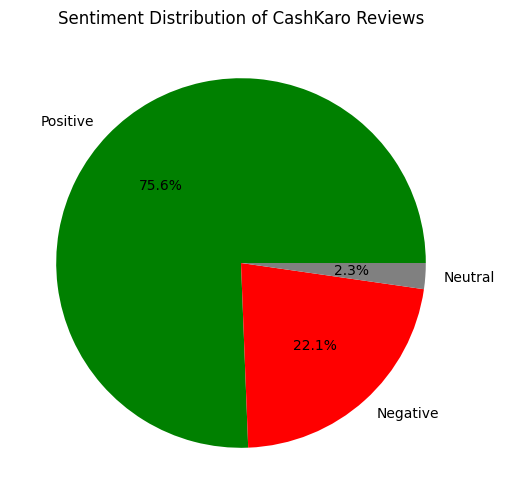

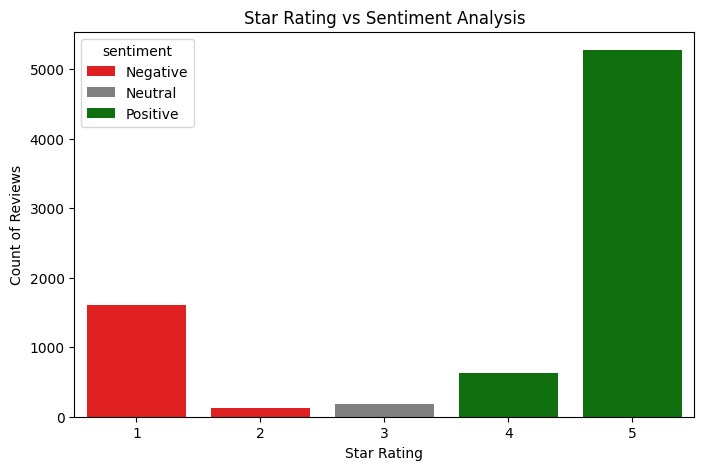

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pie chart for sentimenet distribution
sentiment_counts = df['sentiment'].value_counts()
plt.figure(figsize=(6,6))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=['green', 'red', 'gray'])
plt.title("Sentiment Distribution of CashKaro Reviews")
plt.show()

# Bar plot for star ratings
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='score', hue='sentiment', palette={'Positive': 'green', 'Negative': 'red', 'Neutral': 'gray'})
plt.title("Star Rating vs Sentiment Analysis")
plt.xlabel("Star Rating")
plt.ylabel("Count of Reviews")
plt.show()

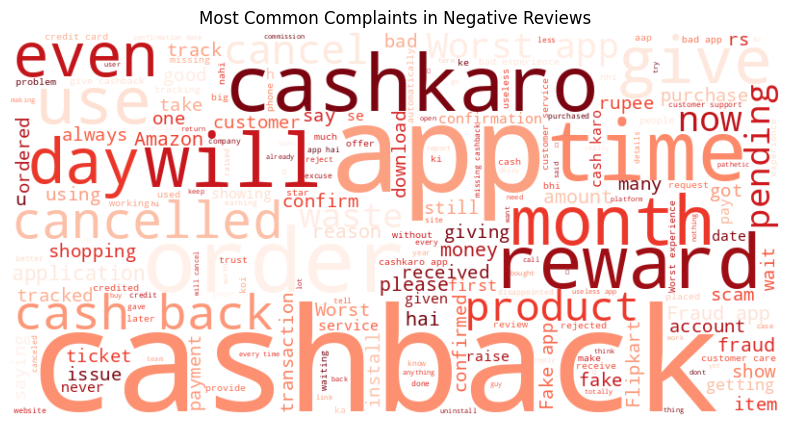

In [ ]:
# Wordcloud
from wordcloud import WordCloud

negative_reviews = " ".join(df[df['sentiment'] == "Negative"]['content'])
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap="Reds").generate(negative_reviews)

plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Most Common Complaints in Negative Reviews")
plt.show()

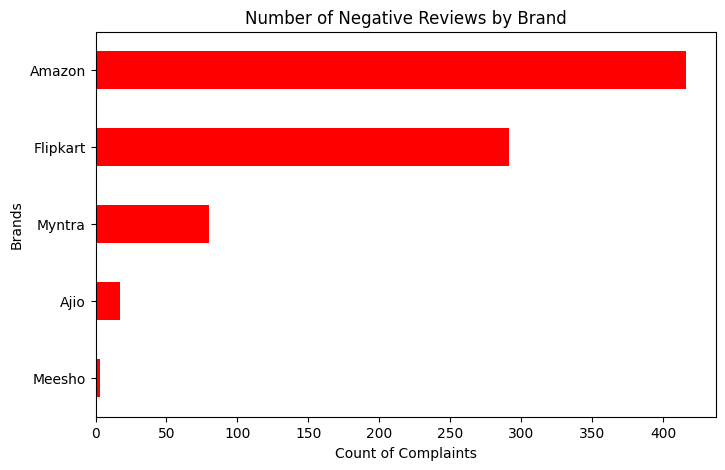

In [ ]:
# Brand Specific Insights
brands = ["Amazon", "Flipkart", "Meesho", "Ajio", "Myntra"]
for brand in brands:
  df[brand] = df['content'].apply(lambda x: 1 if brand.lower() in x.lower() else 0)

brand_complaints = df[brands].sum()

plt.figure(figsize=(8,5))
brand_complaints.sort_values().plot(kind='barh', color='red')
plt.title("Number of Negative Reviews by Brand")
plt.xlabel("Count of Complaints")
plt.ylabel("Brands")
plt.show()

<Figure size 1000x500 with 0 Axes>

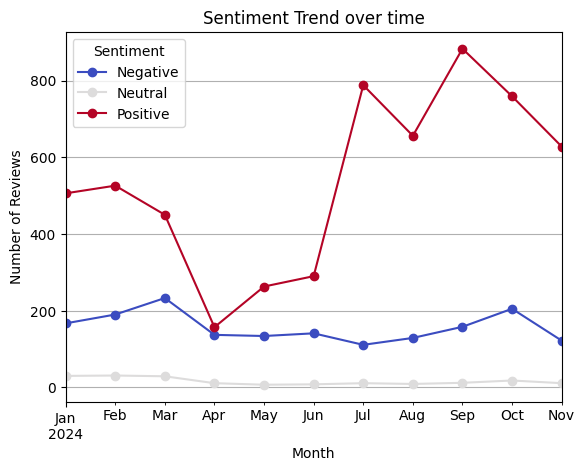

In [ ]:
df['month'] = df['at'].dt.to_period('M')

#Grouping by month and sentiment
monthly_sentiment = df.groupby(['month', 'sentiment']).size().unstack().fillna(0)

plt.figure(figsize=(10,5))
monthly_sentiment.plot(kind='line', marker='o', colormap='coolwarm')
plt.title("Sentiment Trend over time")
plt.xlabel("Month")
plt.ylabel("Number of Reviews")
plt.legend(title="Sentiment")
plt.grid(True)
plt.show()

In [ ]:
df.sample(10)

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,month
8274,2024-03-12 14:07:53,5,nice experience,Positive,0,0,0,0,0,2024-03
7521,2024-05-03 10:28:32,5,it's super experience I love it I will more happy with cash Karo thank you so much,Positive,0,0,0,0,0,2024-05
4820,2024-09-09 14:49:35,5,"The CashKaro app is a game-changer for online shoppers! It offers incredible cashback on purchases from top retailers like Amazon and Flipkart. The app is easy to use, and cashback tracking is seamless. With a wide range of deals and quick, hassle-free bank transfers, it’s perfect for smart shopping. Customer support is prompt and helpful too. Overall, if you love saving while shopping online, CashKaro is a must-have app!",Positive,1,1,0,0,0,2024-09
4680,2024-09-14 00:49:26,1,The vip pass is not working it's in glitch please fix it,Negative,0,0,0,0,0,2024-09
8493,2024-03-03 07:07:10,5,I have got more than 7k cashback and rewards till now... Awesome app 😁,Positive,0,0,0,0,0,2024-03
6566,2024-07-02 08:58:34,5,Good👍,Positive,0,0,0,0,0,2024-07
2741,2024-11-06 08:14:57,5,"I've earned a total of 2600rs in cashback so far using CashKaro, and I rely on it for all my online purchases across platforms like Amazon, Flipkart, and Myntra. The cashback process is straightforward, and withdrawing the money is quick and easy. Highly recommend this app for anyone looking to save on their online shopping!",Positive,1,1,0,0,1,2024-11
3169,2024-10-25 14:20:30,4,Extra cash back available.,Positive,0,0,0,0,0,2024-10
7708,2024-04-13 10:41:22,1,Not able to login to my account,Negative,0,0,0,0,0,2024-04
8981,2024-02-14 09:58:53,5,this is a really good app... mujhe cashback v milti hai,Positive,0,0,0,0,0,2024-02


In [ ]:
### Feature Requests from Users

In [ ]:
feature_words = ["add", "feature", "improve", "want", "new", "request"]
df['feature_request'] = df['content'].apply(lambda x: any(word in x.lower() for word in feature_words))

df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,month,feature_request
2198,2024-11-29 18:31:39,5,It's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0,2024-11,False
2199,2024-11-29 18:07:32,5,"Great application. It just changed my way of shopping. Before CK, I was just spending but now I am earning also while I spend.",Positive,0,0,0,0,0,2024-11,False
2200,2024-11-29 13:13:52,5,Nice,Positive,0,0,0,0,0,2024-11,False
2201,2024-11-29 12:57:49,5,"It's amazing app and and purchase online Flipkart, amazon, Myntra... By this app thebest cash back offer given this app I have not ever seen Cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1,2024-11,True
2202,2024-11-29 12:52:25,4,All about always extra cashback,Positive,0,0,0,0,0,2024-11,False


In [ ]:
feature_request_count = df['feature_request'].sum()

In [ ]:
feature_request_count

559

In [ ]:
print(f"{feature_request_count} users have requested new features.")

559 users have requested new features.


In [ ]:
feature_text = " ".join(df[df['feature_request'] == True]['content'])
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate(feature_text)

In [ ]:
wordcloud

In [ ]:
plt.show()

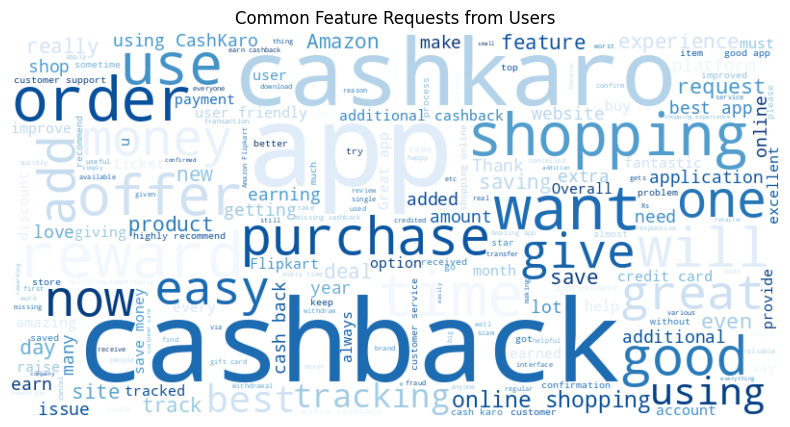

In [ ]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Common Feature Requests from Users")
plt.show()

<ipython-input-36-a64e02e9dedd>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(top_issues.values()), y=list(top_issues.keys()), palette='Reds')


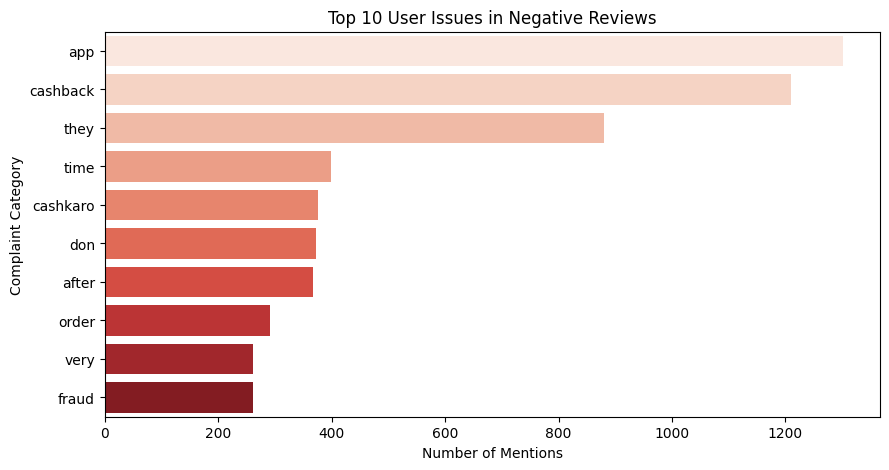

In [ ]:
from collections import Counter
import seaborn as sns
import re

# Extract negative reviews
negative_reviews = df[df['sentiment'] == "Negative"]['content'].str.lower().tolist()

# Preprocess: Remove special characters & numbers
cleaned_reviews = [" ".join(re.findall(r'\b[a-zA-Z]{3,}\b', review)) for review in negative_reviews]

# Combine all reviews into a single text
all_words = " ".join(cleaned_reviews).split()

# Count occurrences of words
word_counts = Counter(all_words)

# Remove common stopwords (you can add more)
stopwords = set(["the", "and", "for", "with", "your", "have", "this", "that", "from", "not", "are", "was", "but", "you", "can", "all", "more", "will"])
filtered_word_counts = {word: count for word, count in word_counts.items() if word not in stopwords}

# Get top 10 issues dynamically
top_issues = dict(Counter(filtered_word_counts).most_common(10))

# Plot top issues
plt.figure(figsize=(10, 5))
sns.barplot(x=list(top_issues.values()), y=list(top_issues.keys()), palette='Reds')
plt.xlabel("Number of Mentions")
plt.ylabel("Complaint Category")
plt.title("Top 10 User Issues in Negative Reviews")
plt.show()

In [ ]:
df[df["sentiment"] == "Negative"].shape

(1727, 11)

In [ ]:
df["content"].str.lower()

,content
2198,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕
2199,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend."
2200,nice
2201,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money"
2202,all about always extra cashback
2203,"cashkaro providing cashback for almost all orders, making it a great app for passive earnings."
2204,best cashback app...saved much money so far
2205,"really a cash back app can say it genuine, using for almost 3 years very very less rejection rate that too may be due to the some companies like amazon which get tracked less"
2206,"updated the app. followed instructions, selected amazon, added items to the cart only after i was redirected & placed the order asap, only to receive a notification that i missed to save big! update1: now getting a confirmation mail, with order details & expected date of cashback credit which is great but i do still recieve a notification which states ""you missed to save big!"" & asks me to ""check out now!"" even after i had placed the order! contradictory communication. edit: the issue persists."
2207,good app for cashback using cashkaro for more then 1 year and usually receive 3-5% cashback for orders tracking system of reward is also good


In [ ]:
df["content"] = df["content"].str.lower()

In [ ]:
df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,month,feature_request
2198,2024-11-29 18:31:39,5,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0,2024-11,False
2199,2024-11-29 18:07:32,5,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend.",Positive,0,0,0,0,0,2024-11,False
2200,2024-11-29 13:13:52,5,nice,Positive,0,0,0,0,0,2024-11,False
2201,2024-11-29 12:57:49,5,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1,2024-11,True
2202,2024-11-29 12:52:25,4,all about always extra cashback,Positive,0,0,0,0,0,2024-11,False


<ipython-input-61-b40998628bbd>:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=issue_percentages, y=issue_percentages.index, palette="Reds_r")


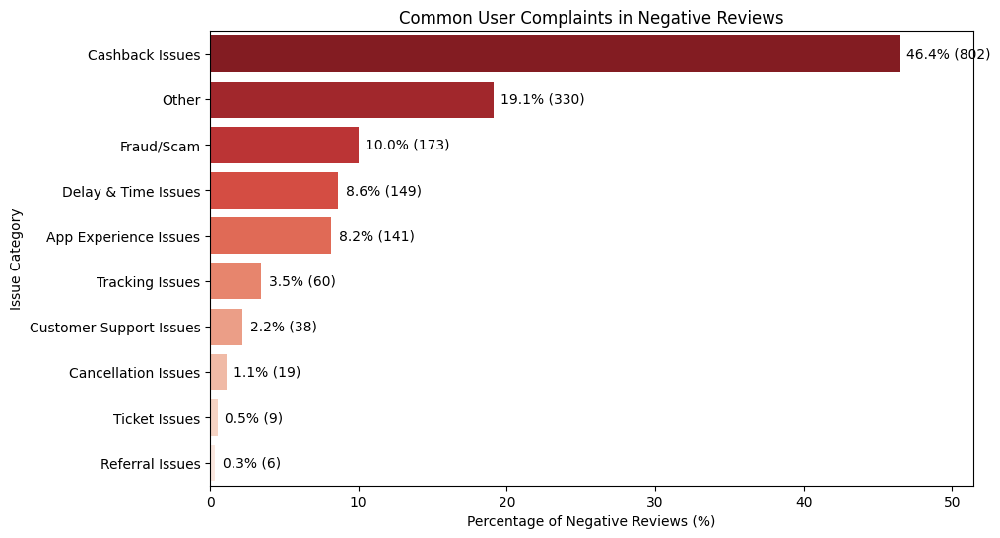

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Updated issue categories (Merging "Fake" into "Fraud/Scam")
issue_categories = {
    "Cashback Issues": ["cancel cashback", "cancelled cashback", "cancel my cashback", "missing cashback", "cashback"],
    "Tracking Issues": ["tracking", "tracked", "track"],
    "Referral Issues": ["referral"],  # Fixed spelling
    "Customer Support Issues": ["no customer support", "poor customer service", "service"],
    "Delay & Time Issues": ["time", "delay"],
    "Fraud/Scam": ["fraud", "scam", "false promise", "fake", "fake reviews", "bogus", "bakwaas", "bakwas"],  # Added 'bakwaas' & 'bakwas'
    "App Experience Issues": ["worst", "useless app", "waste", "bad app", "disgusting", "bad experience", "bad"],
    "Ticket Issues": ["ticket"],
    "Marketing Gimmicks": ["gimmick"],
    "Cancellation Issues": ["cancel", "cancelled"]
}

# Function to categorize issues
def categorize_issue(review):
    for category, keywords in issue_categories.items():
        if any(word in review for word in keywords):
            return category  # Assign the first matched category
    return "Other"  # If no match, label as "Other"

# Filter negative reviews
df_negative = df[df['sentiment'] == "Negative"].copy()

# Apply categorization
df_negative["Issue Category"] = df_negative["content"].apply(categorize_issue)

# Identify "Other" reviews and check if they contain "fake"
df_other = df_negative[df_negative["Issue Category"] == "Other"]
df_other_fake = df_other[df_other["content"].str.contains("fake", na=False)]

# Reassign these to "Fraud/Scam"
df_negative.loc[df_other_fake.index, "Issue Category"] = "Fraud/Scam"

# Recalculate issue counts
issue_counts = df_negative["Issue Category"].value_counts()

# Convert to percentage
total_reviews = len(df_negative)
issue_percentages = (issue_counts / total_reviews) * 100

# Plot horizontal bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=issue_percentages, y=issue_percentages.index, palette="Reds_r")
plt.xlabel("Percentage of Negative Reviews (%)")
plt.ylabel("Issue Category")
plt.title("Common User Complaints in Negative Reviews")
plt.xlim(0, max(issue_percentages) + 5)  # Adjusting limit for better visibility

# Display count labels on bars
for index, value in enumerate(issue_percentages):
    plt.text(value + 0.5, index, f"{value:.1f}% ({issue_counts.iloc[index]})", va="center")

plt.show()

In [ ]:
df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,month,feature_request
2198,2024-11-29 18:31:39,5,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0,2024-11,False
2199,2024-11-29 18:07:32,5,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend.",Positive,0,0,0,0,0,2024-11,False
2200,2024-11-29 13:13:52,5,nice,Positive,0,0,0,0,0,2024-11,False
2201,2024-11-29 12:57:49,5,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1,2024-11,True
2202,2024-11-29 12:52:25,4,all about always extra cashback,Positive,0,0,0,0,0,2024-11,False


ValueError: Boolean array expected for the condition, not object

In [ ]:
df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,month,feature_request,issue_category
2198,2024-11-29 18:31:39,5,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0,2024-11,False,Cashback Issues
2199,2024-11-29 18:07:32,5,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend.",Positive,0,0,0,0,0,2024-11,False,Other
2200,2024-11-29 13:13:52,5,nice,Positive,0,0,0,0,0,2024-11,False,Other
2201,2024-11-29 12:57:49,5,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1,2024-11,True,Delays
2202,2024-11-29 12:52:25,4,all about always extra cashback,Positive,0,0,0,0,0,2024-11,False,Cashback Issues


In [ ]:
df.drop(columns = ['month', 'feature_request'], inplace=True)

In [ ]:
df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra,issue_category
2198,2024-11-29 18:31:39,5,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0,Cashback Issues
2199,2024-11-29 18:07:32,5,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend.",Positive,0,0,0,0,0,Other
2200,2024-11-29 13:13:52,5,nice,Positive,0,0,0,0,0,Other
2201,2024-11-29 12:57:49,5,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1,Delays
2202,2024-11-29 12:52:25,4,all about always extra cashback,Positive,0,0,0,0,0,Cashback Issues


In [ ]:
df.drop(columns = ['issue_category'], inplace=True)

In [ ]:
df.head()

,at,score,content,sentiment,Amazon,Flipkart,Meesho,Ajio,Myntra
2198,2024-11-29 18:31:39,5,it's a great app for shopping and for cashback.you just need to go to your shopping app from their app . it's just that simple.just loved it 💕,Positive,0,0,0,0,0
2199,2024-11-29 18:07:32,5,"great application. it just changed my way of shopping. before ck, i was just spending but now i am earning also while i spend.",Positive,0,0,0,0,0
2200,2024-11-29 13:13:52,5,nice,Positive,0,0,0,0,0
2201,2024-11-29 12:57:49,5,"it's amazing app and and purchase online flipkart, amazon, myntra... by this app thebest cash back offer given this app i have not ever seen cash back also added very short time install this app and make earn more money",Positive,1,1,0,0,1
2202,2024-11-29 12:52:25,4,all about always extra cashback,Positive,0,0,0,0,0
